# Stage-31 Full-Sky High-Mass Paste Diagnostics

This notebook summarizes the four full-sky Abacus Backlight paste products generated with `log10(M200c/[Msun/h]) >= 13.8` at `nside=1024`. It loads the saved diagnostic products rather than recomputing the spectra.

In [1]:
from pathlib import Path
import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Image, display

RUN_ROOT = Path('/mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8')
SUMMARY_JSON = RUN_ROOT / 'measurements/stage31_fullsky_logMgt13p8_diagnostic_summary.json'
BANDPOWER_CSV = RUN_ROOT / 'measurements/stage31_fullsky_logMgt13p8_bandpowers_lmax1024_nbin20.csv'
RAW_CLS_NPZ = RUN_ROOT / 'measurements/stage31_fullsky_logMgt13p8_raw_cls_lmax1024.npz'

with SUMMARY_JSON.open() as handle:
    summary = json.load(handle)
bandpowers = pd.read_csv(BANDPOWER_CSV)
raw_cls = np.load(RAW_CLS_NPZ)

print('summary:', SUMMARY_JSON)
print('bandpowers:', BANDPOWER_CSV)
print('raw cls:', RAW_CLS_NPZ)
print('pixel-window deconvolved:', summary['pixel_window_deconvolved'])
print(summary['spectrum_note'])

summary: /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/measurements/stage31_fullsky_logMgt13p8_diagnostic_summary.json
bandpowers: /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/measurements/stage31_fullsky_logMgt13p8_bandpowers_lmax1024_nbin20.csv
raw cls: /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/measurements/stage31_fullsky_logMgt13p8_raw_cls_lmax1024.npz
pixel-window deconvolved: False
Raw healpy.anafast spectra; no pixel-window deconvolution applied.


## Map Products

In [2]:
rows = []
for pz, product in summary['products'].items():
    gal = product['galaxies']
    rows.append({
        'pz_bin': pz,
        'map_h5': product['map_h5'],
        'n_galaxies': gal['n_galaxies_total_rows'],
        'n_used_for_delta_g': gal['n_galaxies_valid'],
        'bad_coord_excluded': gal['n_galaxies_excluded_bad_coordinates'],
        'surface_density_deg2': gal['surface_density_per_deg2'],
        'mean_per_pixel': gal['mean_per_pixel'],
    })
pd.DataFrame(rows)

,pz_bin,map_h5,n_galaxies,n_used_for_delta_g,bad_coord_excluded,surface_density_deg2,mean_per_pixel
0,pz1,/mnt/ceph/users/spandey/ltu-godmax/GODMAX/data...,935663,935662,1,22.681087,0.074360
1,pz2,/mnt/ceph/users/spandey/ltu-godmax/GODMAX/data...,795923,795923,0,19.293718,0.063254
2,pz3,/mnt/ceph/users/spandey/ltu-godmax/GODMAX/data...,701391,701391,0,17.002198,0.055742
3,pz4,/mnt/ceph/users/spandey/ltu-godmax/GODMAX/data...,563742,563742,0,13.665492,0.044802


## Full-Sky Preview Panels

pz1 /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/plots/stage31_fullsky_logMgt13p8_pz1_map_overview.png


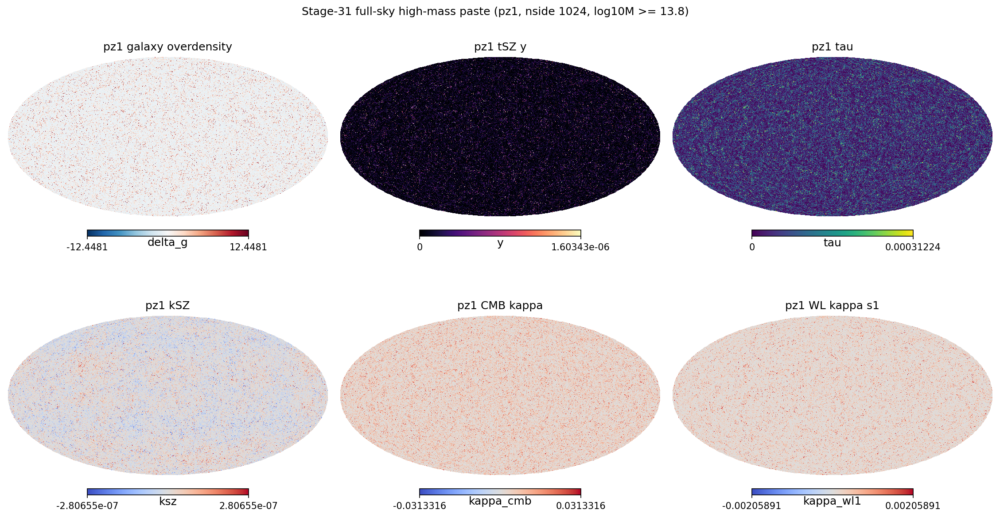

pz2 /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/plots/stage31_fullsky_logMgt13p8_pz2_map_overview.png


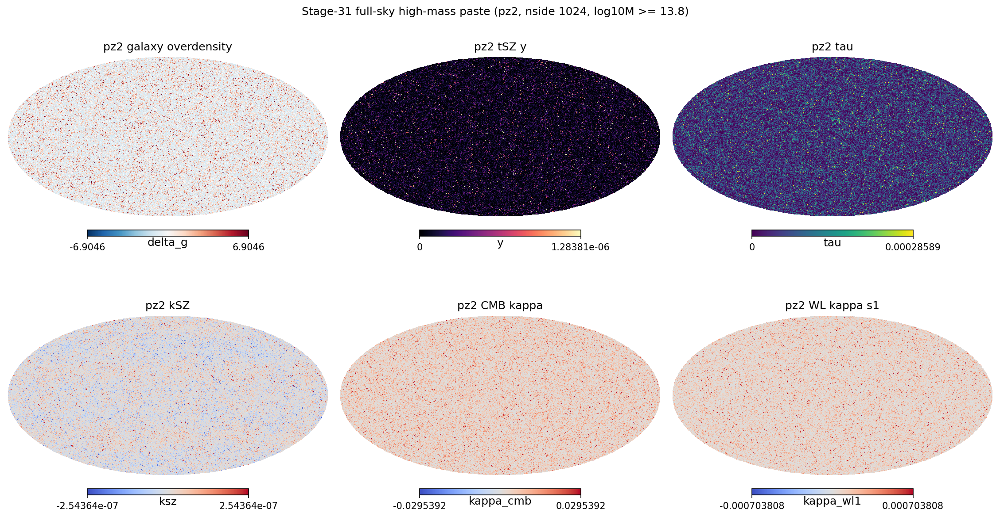

pz3 /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/plots/stage31_fullsky_logMgt13p8_pz3_map_overview.png


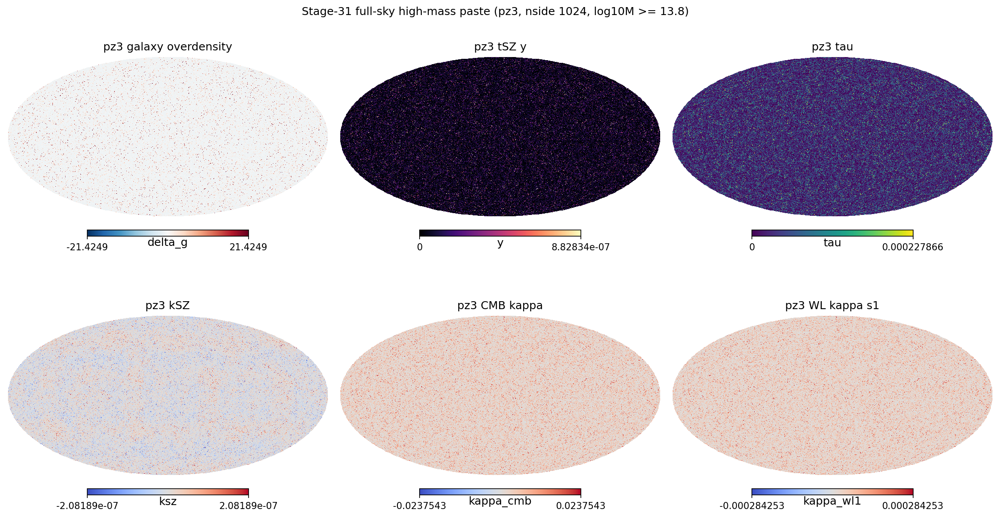

pz4 /mnt/ceph/users/spandey/ltu-godmax/GODMAX/data/xDESI/processed/abacus_backlight/stage31_fullsky_logMgt13p8/plots/stage31_fullsky_logMgt13p8_pz4_map_overview.png


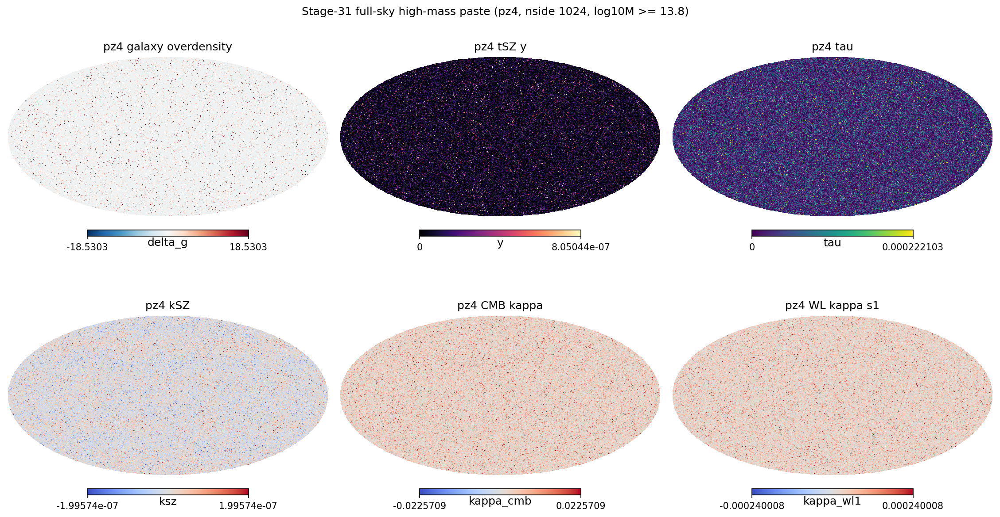

In [3]:
for pz, product in summary['products'].items():
    print(pz, product['plots']['map_overview_png'])
    display(Image(filename=product['plots']['map_overview_png']))

## Correlation Statistics

In [4]:
corr_rows = []
for pz, product in summary['products'].items():
    for field, value in product['pixel_pearson_with_delta_g'].items():
        corr_rows.append({'pz_bin': pz, 'field': field, 'pixel_pearson_with_delta_g': value})
pd.DataFrame(corr_rows).pivot(index='field', columns='pz_bin', values='pixel_pearson_with_delta_g')

pz_bin,pz1,pz2,pz3,pz4
field,,,,
map_kappa_cmb,0.637115,0.666326,0.433252,0.428532
map_kappa_wl,0.436014,0.543876,0.428669,0.422174
map_kappa_wl_tomo2,0.500174,0.497573,0.391600,0.371279
map_kappa_wl_tomo3,0.590644,0.532747,0.325267,0.210787
map_kappa_wl_tomo4,0.613685,0.605097,0.408380,0.335013
map_ksz,-0.005549,0.004402,-0.006618,0.001000
map_tau,0.510080,0.482185,0.385413,0.369626
map_ymap,0.487190,0.363741,0.607576,0.557712


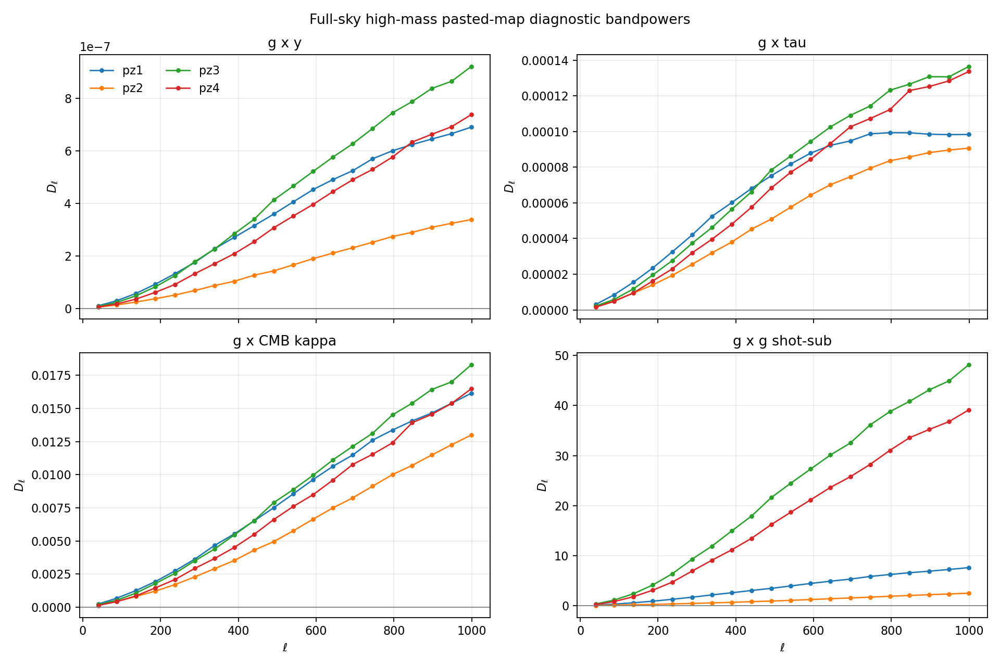

In [5]:
bandpower_png = Path(summary['outputs']['plots'][-1])
display(Image(filename=str(bandpower_png)))

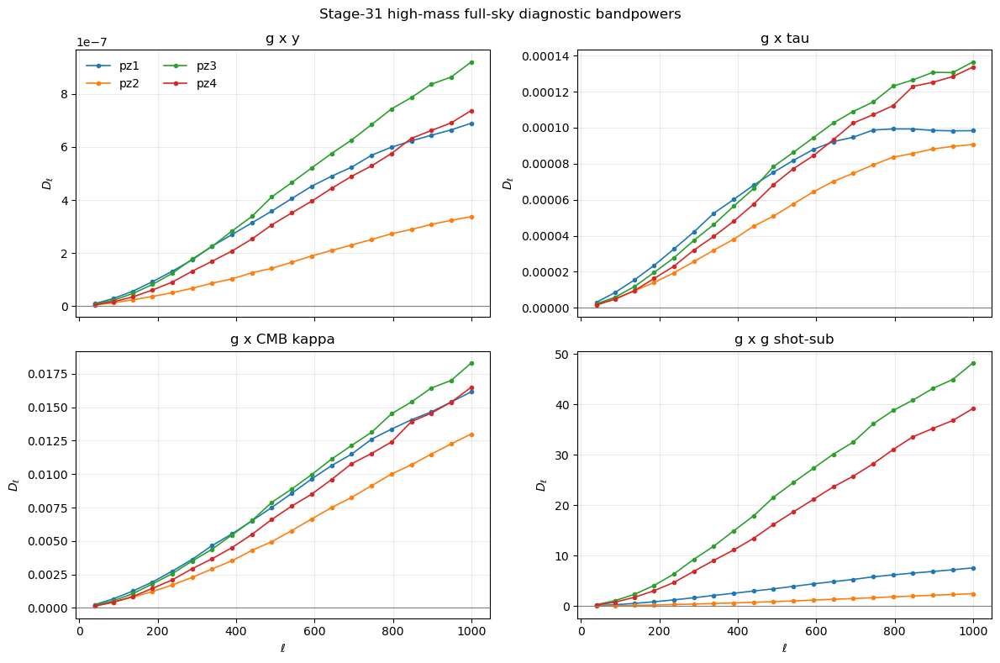

In [6]:
plot_specs = [
    ('g_map_ymap', 'map_ymap', 'g x y'),
    ('g_map_tau', 'map_tau', 'g x tau'),
    ('g_map_kappa_cmb', 'map_kappa_cmb', 'g x CMB kappa'),
    ('gg_shot_sub', 'galaxies', 'g x g shot-sub'),
]

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
for ax, (spectrum, field, title) in zip(axes.ravel(), plot_specs):
    for pz in sorted(summary['products']):
        subset = bandpowers[(bandpowers.pz_bin == pz) & (bandpowers.spectrum == spectrum) & (bandpowers.field == field)]
        ax.plot(subset.ell_eff, subset.dell, marker='o', ms=3, lw=1.2, label=pz)
    ax.axhline(0, color='0.5', lw=0.8)
    ax.set_title(title)
    ax.set_ylabel(r'$D_\ell$')
    ax.grid(alpha=0.25)
for ax in axes[-1]:
    ax.set_xlabel(r'$\ell$')
axes[0, 0].legend(frameon=False, ncol=2)
fig.suptitle('Stage-31 high-mass full-sky diagnostic bandpowers')
fig.tight_layout()
plt.show()